## Manually colapse the events in images 

Collapse the events in the frames to get the most active pixels and get an 'artificial brightnest' of the image 


In [1]:
# Get system path 
import os
path = os.getcwd()
# Get parent directory
parent = os.path.dirname(path)
#Add parent directory to system path
os.sys.path.insert(0, parent)

from metavision_core.event_io import EventsIterator
import numpy as np
import matplotlib.pyplot as plt

from lib.utils import *
from lib.plot_utils import *   
from lib.event_processing import *

from metavision_core.event_io import EventsIterator
from metavision_sdk_core import PeriodicFrameGenerationAlgorithm
from metavision_sdk_ui import EventLoop, BaseWindow, Window, UIAction, UIKeyEvent

import cv2

In [2]:
#Dynamicaly reload modules in juptyer notebook
%load_ext autoreload 
%autoreload 2

## SUN CALIBRATION

Original lenght 1113
Final lenght 1


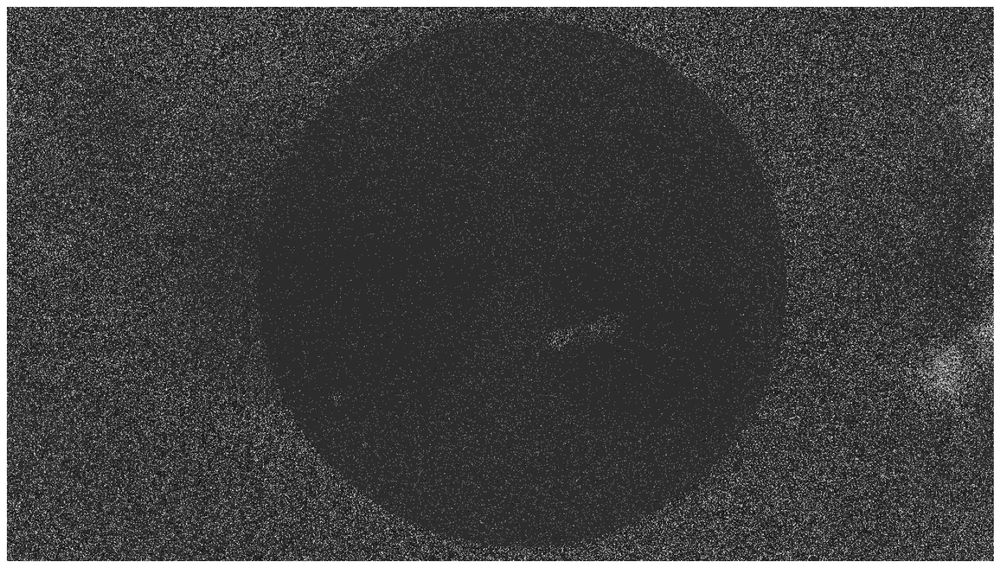

In [10]:
from lib.event_processing import *  

path = "../data/recordings/03_05/sun_calibration_FOV1.raw"
mv_iterator = EventsIterator(input_path=path, delta_t=1000)

height, width = mv_iterator.get_size()  # Camera Geometry
event_frame_gen = PeriodicFrameGenerationAlgorithm(width, height, accumulation_time_us=10000)

frames = []

def on_cd_frame_cb(ts, cd_frame):
    # window.show(cd_frame)
    frames.append(cd_frame)

event_frame_gen.set_output_callback(on_cd_frame_cb)

for evs in mv_iterator:
    event_frame_gen.process_events(evs)

print('Original lenght', len(frames))

max_buffer = 700
blend = np.array(np.zeros((cv2.cvtColor(np.array(frames[0]), cv2.COLOR_BGR2GRAY).shape)))
compact_frames = []
count = 0
frames_buffer = []

for frame in frames:
    frames_buffer.append(frame)

    if len(frames_buffer) == max_buffer:
        blend = calibration_blend(frames_buffer)
        # blend = blend_buffer(frames_buffer)

        compact_frames.append(blend.astype(np.uint8))
        frames_buffer = []

print('Final lenght', len(compact_frames))

# Plot original image with
plot_image(np.array(compact_frames[0]))
# cv2.imwrite("raw_sun.png", compact_frames[0])



## Filter testing

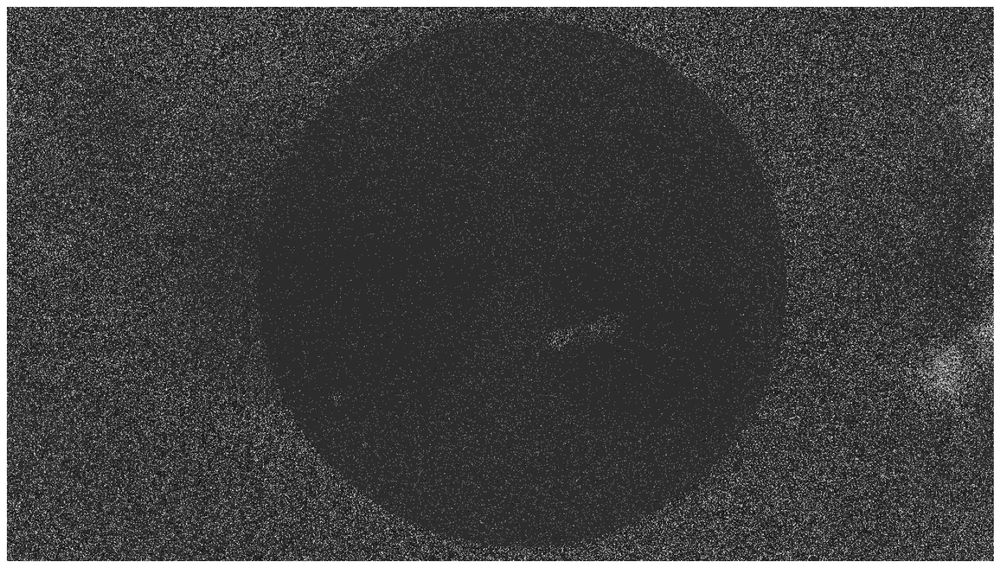

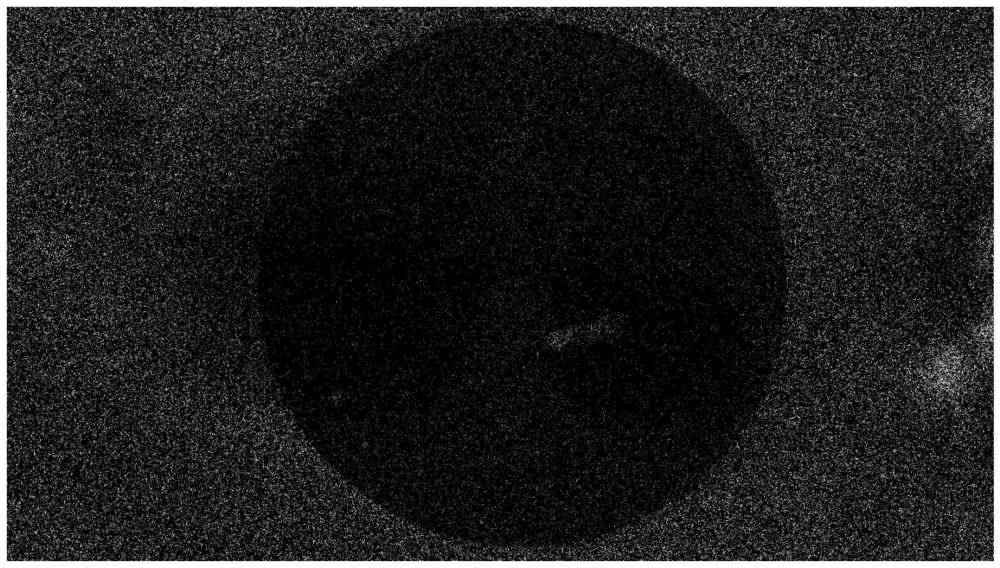

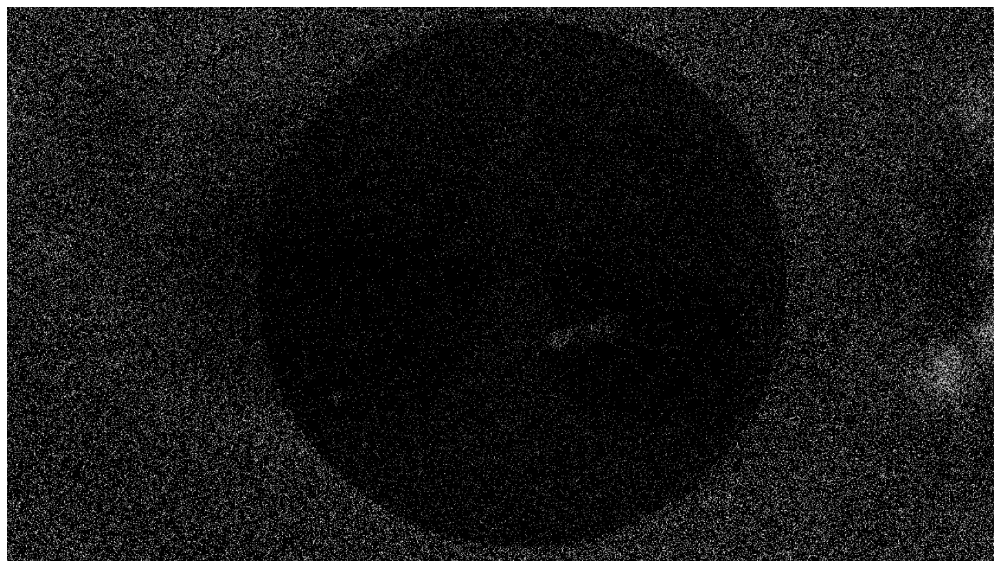

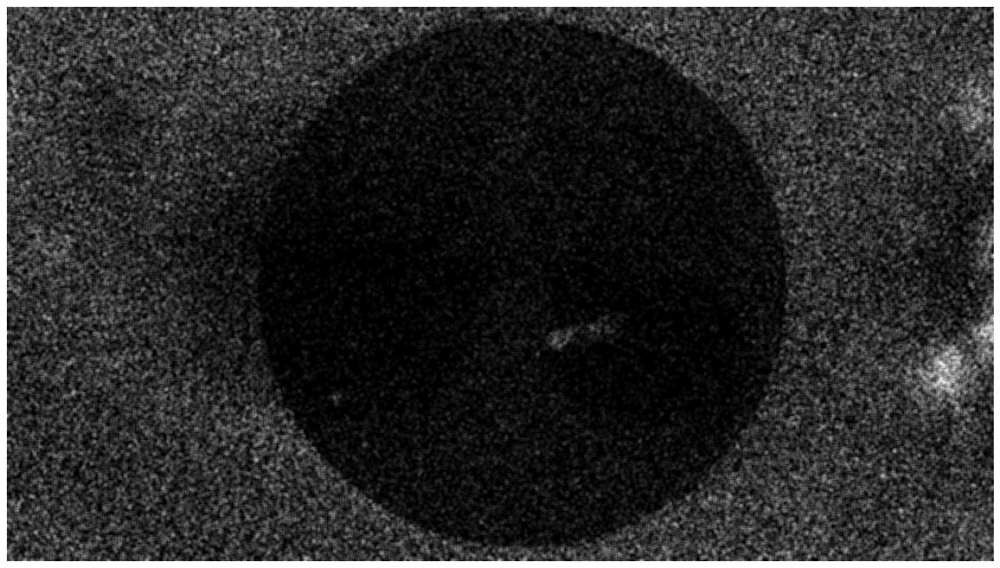

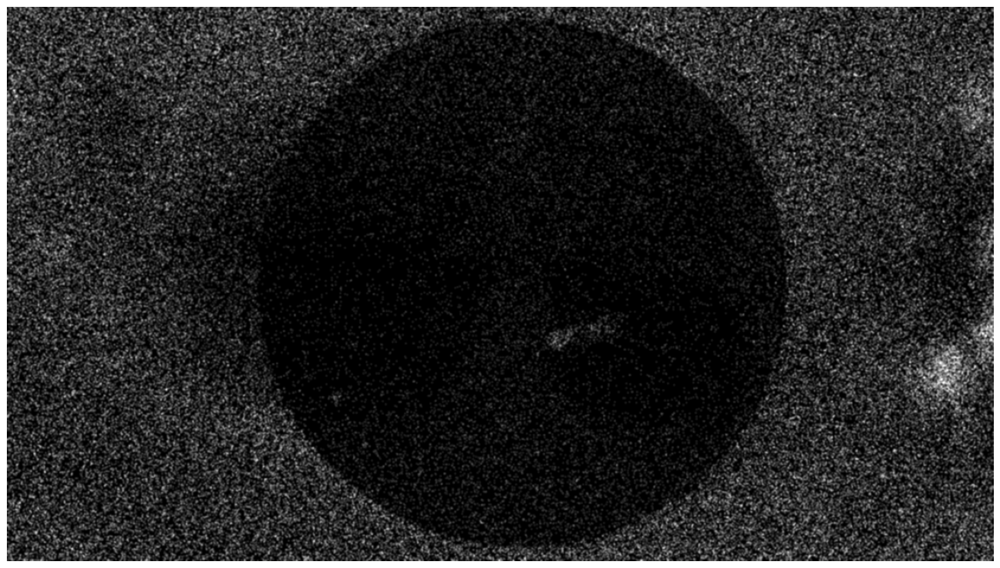

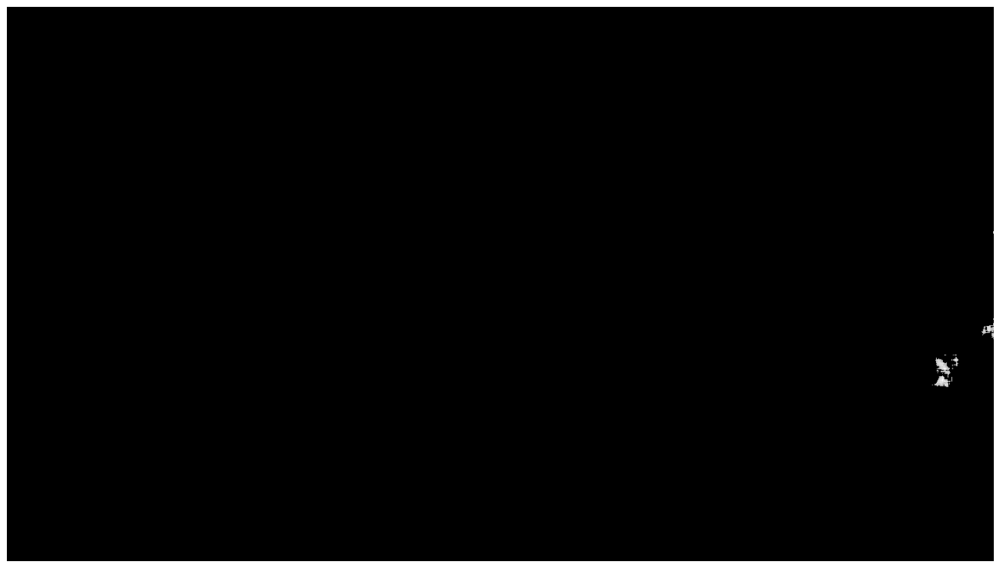

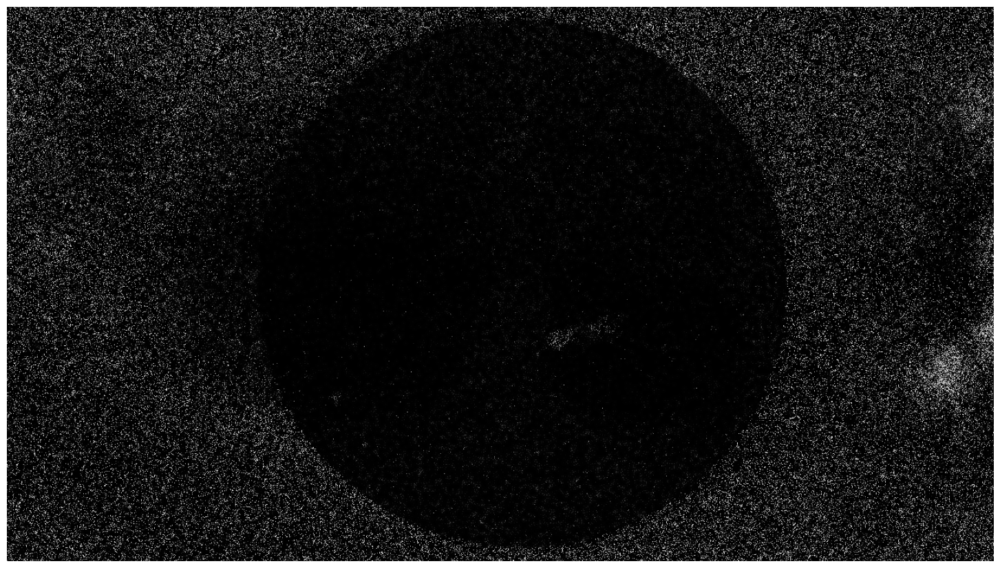

In [11]:
#Plor one frame as an example

frame =compact_frames[0]
plot_image(np.array(frame))

frame_thr = cv2.threshold(frame, 100, 1, cv2.THRESH_TOZERO)[1]
plot_image(frame_thr)

#Soften the image
dst = cv2.fastNlMeansDenoising(frame_thr)
plot_image(dst)

kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(frame_thr,-1,kernel)
plot_image(dst)


blur = cv2.GaussianBlur(frame_thr,(5,5),0)
plot_image(blur)
# Threshold filter

median = cv2.medianBlur(frame_thr,9)
plot_image(median)

blur = cv2.bilateralFilter(frame_thr,9,75,75)
plot_image(blur)


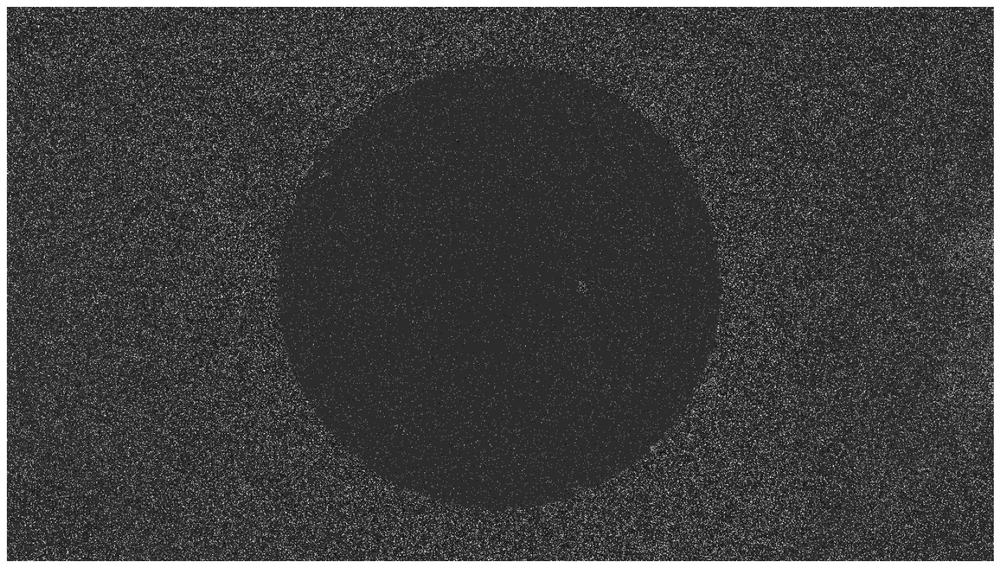

max value:  255 min value:  0


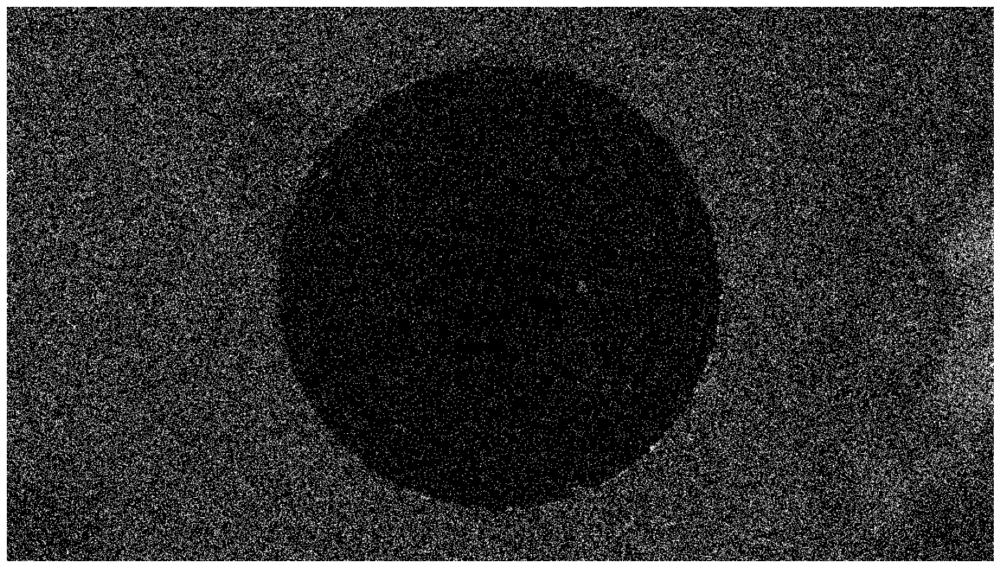

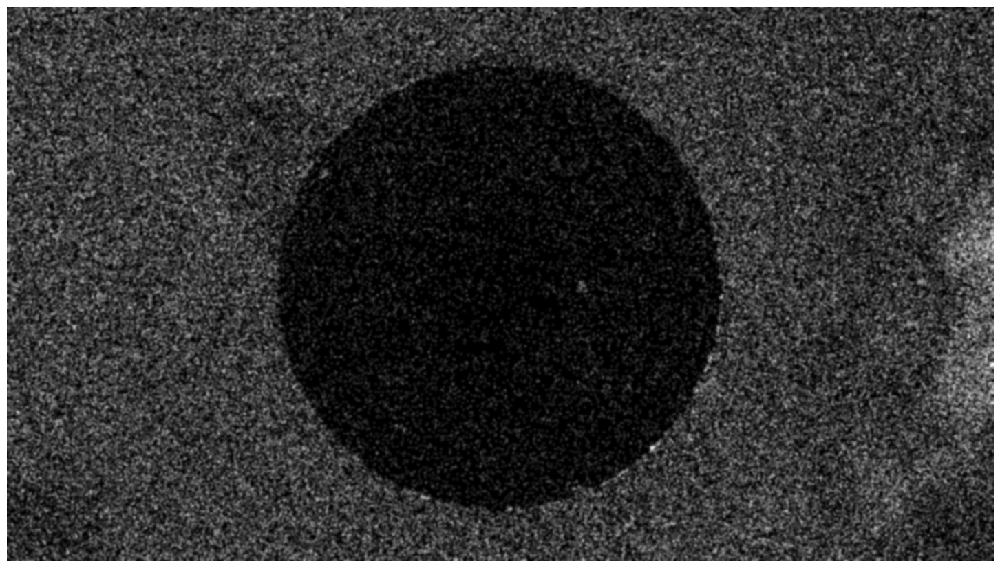

In [5]:
#Plot one frame as an example
from lib.plot_utils import *

frame =compact_frames[0]
plot_image(np.array(frame))

frame = cv2.threshold(frame, 50, 1, cv2.THRESH_BINARY)[1]
frame = frame*255

print('max value: ', np.max(frame), 'min value: ', np.min(frame))
plot_image(frame)

blur = cv2.GaussianBlur(frame,(7,7),0)
plot_image(blur)

# for i in range(5):
    
# for i in range(5):

#     blur = cv2.threshold(blur, 250, 1, cv2.THRESH_BINARY)[1]
#     blur = blur*255 
#     plot_image(blur)

#     blur = cv2.GaussianBlur(frame,(5,5),0)
#     plot_image(blur)

# cv_plot(cv2.cvtColor(blur*255, cv2.COLOR_GRAY2RGB) )
# cv_plot(frame )

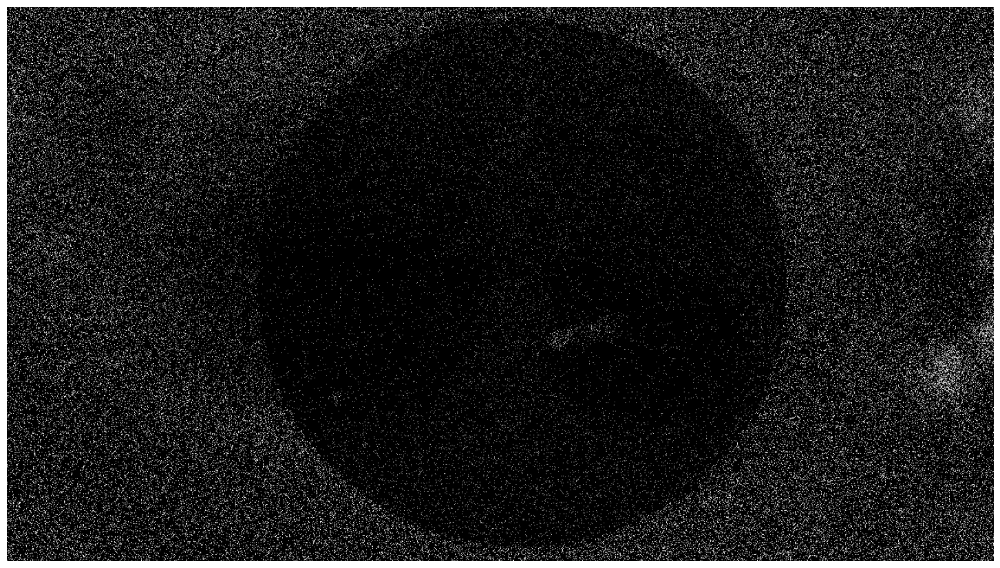

max value:  255 min value:  0


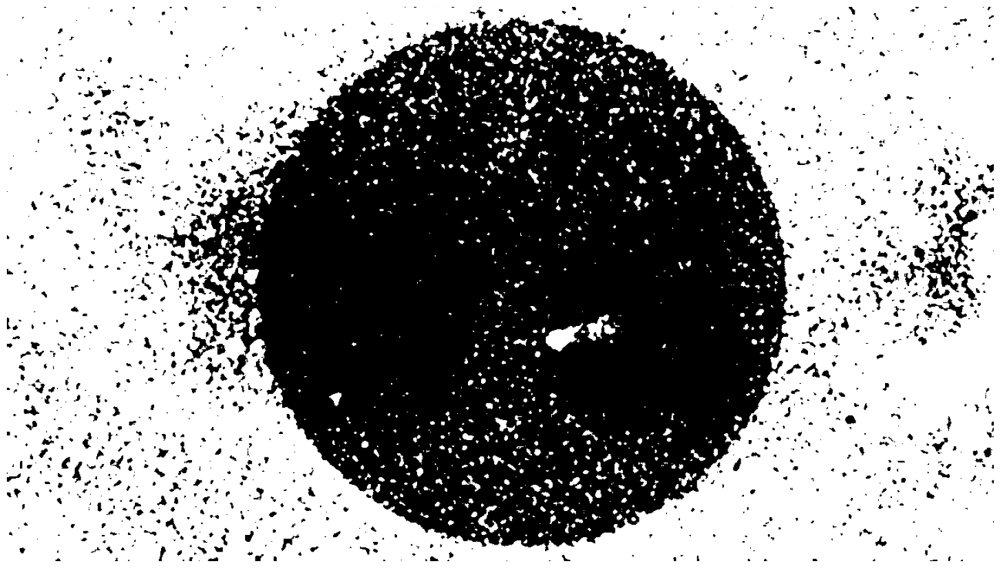

In [29]:
compact_frame = compact_frames[0]
frame = cv2.threshold(compact_frame, 120, 1, cv2.THRESH_TOZERO)[1]
plot_image(frame)

for i in range(2):
    frame = cv2.blur(frame,(5,5))
    frame = cv2.threshold(frame, 10, 1, cv2.THRESH_TOZERO)[1]

frame = cv2.threshold(frame*255, 120, 1, cv2.THRESH_BINARY)[1]
frame = frame*255

# for i in range(5):
#   frame = cv2.blur(frame,(5,5))

print('max value: ', np.max(frame), 'min value: ', np.min(frame)) 

# frame = frame*255
# print('max value: ', np.max(frame), 'min value: ', np.min(frame)) 

# frame = frame + compact_frames[0]
plot_image(frame)



## Manual search

In [32]:

image = frame
# plot_image(image)

output = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
gray =  image

# detect circles in the image
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 1000,
						   param1=15,param2=15,minRadius=50,maxRadius=400)
# ensure at least some circles were found
if circles is not None:
	# convert the (x, y) coordinates and radius of the circles to integers
	circles = np.round(circles[0, :]).astype("int")
	# loop over the (x, y) coordinates and radius of the circles
	
    # r = circles[0][2]

	for (x, y, r) in circles: 
		# draw the circle in the output image, then draw a rectangle
		# corresponding to the center of the circle
		cv2.circle(output, (x, y), r, (0, 255, 0), 4)
		cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

		print(f"Circle center: {x,y} , radius: {r}")

	# show the output image
	cv2.imshow("output", output)
	# save image to disk
	cv2.waitKey(0)
	cv2.destroyAllWindows()
	cv2.imwrite("output.png", output)

else:
	print("No circles found")


FOV = 1
sun_aparent_diameter = 0.54152 # From stelarium [degrees]
print('Circle detected, diameter: ', r*2, ' [pixels], pixel to degree ratio: '
            , sun_aparent_diameter/(r*2), ' [degrees/pixel]', sun_aparent_diameter/(r*2)*3600, ' [arcsec/pixel]')

print( 'FOV: ', FOV, ' [degrees]' 	)			

Circle center: (668, 358) , radius: 342
Circle detected, diameter:  684  [pixels], pixel to degree ratio:  0.0007916959064327486  [degrees/pixel] 2.8501052631578947  [arcsec/pixel]
FOV:  2  [degrees]


## Parameters search 

In [17]:
import numpy as np
import argparse
import cv2
import signal

from functools import wraps
import errno
import os
import copy


image = frame 

# image = cv2.imread(args["image"])
image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
orig_image = np.copy(image)
output = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

circles = None

minimum_circle_size = 100      #this is the range of possible circle in pixels you want to find
maximum_circle_size = 300     #maximum possible circle size you're willing to find in pixels

guess_dp = 1.0

number_of_circles_expected = 1          #we expect to find just one circle
breakout = False

max_guess_accumulator_array_threshold = 100     #minimum of 1, no maximum, (max 300?) the quantity of votes 
                                                #needed to qualify for a circle to be found.
circleLog = []

guess_accumulator_array_threshold = max_guess_accumulator_array_threshold


while guess_accumulator_array_threshold > 1 and breakout == False:
    #start out with smallest resolution possible, to find the most precise circle, then creep bigger if none found
    guess_dp = 1.0
    print("resetting guess_dp:" + str(guess_dp))
    while guess_dp < 9 and breakout == False:
        guess_radius = maximum_circle_size
        print("setting guess_radius: " + str(guess_radius))
        print(circles is None)
        while True:

            #HoughCircles algorithm isn't strong enough to stand on its own if you don't
            #know EXACTLY what radius the circle in the image is, (accurate to within 3 pixels) 
            #If you don't know radius, you need lots of guess and check and lots of post-processing 
            #verification.  Luckily HoughCircles is pretty quick so we can brute force.

            print("guessing radius: " + str(guess_radius) + 
                    " and dp: " + str(guess_dp) + " vote threshold: " + 
                    str(guess_accumulator_array_threshold))


            circles = cv2.HoughCircles(gray, 
                cv2.HOUGH_GRADIENT, 
                dp=guess_dp,               #resolution of accumulator array.
                minDist=100,                #number of pixels center of circles should be from each other, hardcode
                param1=50,
                param2=guess_accumulator_array_threshold,
                minRadius=(guess_radius-3),    #HoughCircles will look for circles at minimum this size
                maxRadius=(guess_radius+3)     #HoughCircles will look for circles at maximum this size
                )

            if circles is not None:
                if len(circles[0]) == number_of_circles_expected:
                    print("len of circles: " + str(len(circles)))
                    circleLog.append(copy.copy(circles))
                    print("k1")
                break
                circles = None
            guess_radius -= 5 
            if guess_radius < 40:
                break

        guess_dp += 1.5

    guess_accumulator_array_threshold -= 2

#Return the circleLog with the highest accumulator threshold

# ensure at least some circles were found
for cir in circleLog:
    # convert the (x, y) coordinates and radius of the circles to integers
    output = np.copy(orig_image)

    if (len(cir) > 1):
        print("FAIL before")
        exit()

    print(cir[0, :])

    cir = np.round(cir[0, :]).astype("int")

    for (x, y, r) in cir:
        cv2.circle(output, (x, y), r, (0, 0, 255), 2)
        cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

    cv2.imshow("output", np.hstack([orig_image, output]))
    cv2.waitKey(0)
    cv2.destroyAllWindows()

resetting guess_dp:1.0
setting guess_radius: 300
True
guessing radius: 300 and dp: 1.0 vote threshold: 100
guessing radius: 295 and dp: 1.0 vote threshold: 100
guessing radius: 290 and dp: 1.0 vote threshold: 100
guessing radius: 285 and dp: 1.0 vote threshold: 100
guessing radius: 280 and dp: 1.0 vote threshold: 100
guessing radius: 275 and dp: 1.0 vote threshold: 100
guessing radius: 270 and dp: 1.0 vote threshold: 100
guessing radius: 265 and dp: 1.0 vote threshold: 100
guessing radius: 260 and dp: 1.0 vote threshold: 100
guessing radius: 255 and dp: 1.0 vote threshold: 100
guessing radius: 250 and dp: 1.0 vote threshold: 100
guessing radius: 245 and dp: 1.0 vote threshold: 100
guessing radius: 240 and dp: 1.0 vote threshold: 100
guessing radius: 235 and dp: 1.0 vote threshold: 100
guessing radius: 230 and dp: 1.0 vote threshold: 100
guessing radius: 225 and dp: 1.0 vote threshold: 100
guessing radius: 220 and dp: 1.0 vote threshold: 100
guessing radius: 215 and dp: 1.0 vote thresho

KeyboardInterrupt: 

In [42]:
circleLog

[]

## WORKING VERSION (CAN BE UPGRADED)

In [20]:
sun_aparent_diameter = 0.54152 # From stelarium [degrees]
FOV = 2                # From stelarium (Depends on zoom) [degrees]

compact_frame = compact_frames[0]
frame = cv2.threshold(compact_frame, 100, 1, cv2.THRESH_TOZERO)[1]

for i in range(96):
    frame = cv2.blur(frame,(5,5))
    frame = cv2.threshold(frame, 5, 1, cv2.THRESH_TOZERO)[1]

circles = cv2.HoughCircles(frame, cv2.HOUGH_GRADIENT, 1, 300,
                param1=10,param2=30,minRadius=200,maxRadius=600)

if circles is not None:

    if len(circles) > 1:
        print("Error: More than one circle detected")
    else:
        print('Circle detected, diameter: ', circles[0][0][2]*2, ' [pixels], pixel to degree ratio: '
            , sun_aparent_diameter/circles[0][0][2]*2, ' [degrees/pixel]',    'FOV: ', FOV, ' [degrees]')
else:
    print('No circle detected')

Circle detected, diameter:  418.3999938964844  [pixels], pixel to degree ratio:  0.005177055524852388  [degrees/pixel] FOV:  2  [degrees]


In [21]:
# Visualization 
# detect circles in the image

output = cv2.cvtColor(frame, cv2.COLOR_GRAY2RGB)
gray =  frame

circles = cv2.HoughCircles(frame, cv2.HOUGH_GRADIENT, 1, 300,
                param1=10,param2=30,minRadius=200,maxRadius=600)

# ensure at least some circles were found
if circles is not None:
	# convert the (x, y) coordinates and radius of the circles to integers
	circles = np.round(circles[0, :]).astype("int")
	# loop over the (x, y) coordinates and radius of the circles
	
    # r = circles[0][2]

	for (x, y, r) in circles:
		# draw the circle in the output image, then draw a rectangle
		# corresponding to the center of the circle
		cv2.circle(output, (x, y), r, (0, 255, 0), 4)
		cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

		print(f"Circle center: {x,y} , radius: {r}")
	# show the output image
	cv2.imshow("output", output)
	cv2.waitKey(0)
	cv2.destroyAllWindows()
else:
	print("No circles found")

Circle center: (676, 360) , radius: 209


In [41]:
pixel_to_Deg = 0.005319449742301844

print('pixel_to_Deg: ', pixel_to_Deg*3600)

pixel_to_Deg:  19.150019072286636
